This notebook performs a PCA for a subset of records, filtered by archiveType/paleoData_proxy. For each subset, the following algorithm is being used:

1. Filter archive_type and paleoData_proxy (defines subset) and produces summary plots of the data, in particular regarding: coverage, resolution and length of the records. This gives us information for the next step, in which we need to choose the parameters for the PCA
2. Define proxy specific parameters for the PCA:
    - period (start and end year): choose a period of sufficient data density (all records chosen for the analysis need to at least overlap during this period)
    - minimum resolution: records exceeding this resolution are being excluded from the analysis. Records with higher resolution will be subsampled to create homogeneous resolution across all the records.
    - record length: records shorter than the record length are being excluded from the analysis.
    - The choice of parameters will determine the success of the PCA. There is a trade-off between the number of records included and the quality (i.e. period/record length/resolution).
    - Summary figures are being produced for the filtered data
    - z-scores added to dataframe (mean=0 and std=1 over the entire record) as 'paleoData_zscores'
    - note: z-scores may be biased if records are only partly overlapping in time, or increase in availability over time, or both.
4. Homogenise data dimensions across the records
    - defines a homogenised time variable over the target period and with the target resolution (as defined in the last step), which is saved as a new column in the dataframe named 'years_hom'
    - creates a data matrix with dimensions n_records x n_time which is saved as a new column in df, named 'paleoData_values_hom' and 'paleoData_zscores_hom'.
    - Note that this data is formatted as a np.ma.masked_array, where missing data is set to zero and masked out.
6. PCA
    - obtains covariance matrix of paleoData_zscores_hom (note that for every two records the covariance is calculated over their intersect of data availability)
    - obtains eigenvectors and eigenvalues via SVD composition
    - obtains and plots fraction of explained variance, first two PCs and load for first two EOFs vs ordering in the data frame.


2025/01/08 v0: Outlined by Michael N. Evans for T analysis; T analysis notebook written by Lucie J. Luecke.

2025/02/07-03/19 v0.9: Notebook now includes summary figures at the end which plot results for different proxies on same axis and the global map of EOF loadings. Added documentation.  Minor changes to make table3 of the manuscript for ESSD, and to revise T_PCA.pdf output.

2025/06/02: T_analysis_v9.3 is a copy of T analysis but for climateInterpretation_variable T instead of T.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature 
from matplotlib.gridspec import GridSpec as GS
import scipy.io as sio
from copy import deepcopy as dc

In [3]:
# choose working directory
wdir = '/home/jupyter-lluecke/compile_proxy_database_v2.1'
os.chdir(wdir)
print(wdir)
import functions as f # contains functions for data processing, plotting etc.
import f_analysis as fan

# contains functions for data analysis

/home/jupyter-lluecke/compile_proxy_database_v2.1


In [4]:
# read dataframe 
# e.g. PAGES2k but works with any dataframe as long as notation is followed

db_name = 'dod2k_dupfree_dupfree_T'

# load dataframe
df = f.load_compact_dataframe_from_csv(db_name)

print(df.originalDatabase.unique())

df.name = db_name

archive_colour, archives_sorted, proxy_marker  = fan.df_colours_markers()

['FE23 (Breitenmoser et al. (2014))' 'CoralHydro2k v1.0.0'
 'dod2k_composite_standardised' 'Iso2k v1.0.1'
 'PAGES2k v2.0.0 (Ocn_103 updated with Dee et al. 2020)' 'SISAL v3']
0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1


In [5]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1203 entries, 0 to 1202
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   archiveType                           1203 non-null   object 
 1   climateInterpretation_variable        1203 non-null   object 
 2   climateInterpretation_variableDetail  1203 non-null   object 
 3   dataSetName                           1203 non-null   object 
 4   datasetId                             1203 non-null   object 
 5   duplicateDetails                      1203 non-null   object 
 6   geo_meanElev                          1185 non-null   float32
 7   geo_meanLat                           1203 non-null   float32
 8   geo_meanLon                           1203 non-null   float32
 9   geo_siteName                          1203 non-null   object 
 10  originalDataURL                       1203 non-null   object 
 11  originalDatabase 

# data analysis

In [6]:
time    = {}
data    = {}
PCs     = {}
EOFs    = {}
foev    = {}
pca_rec = {}

keys    = []

## tree TRW

### filter archive_type and paleoData_proxy

n_records   :  629
archive type:  {'tree'}
proxy type:    {'TRW'}


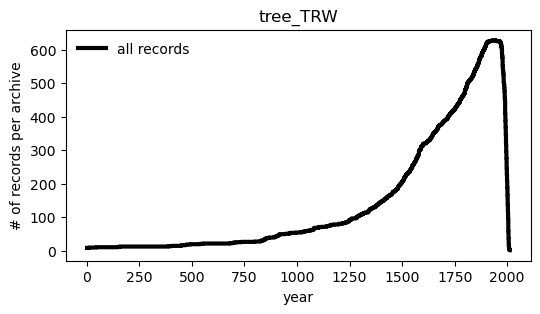

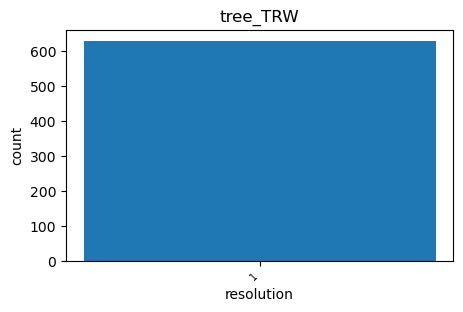

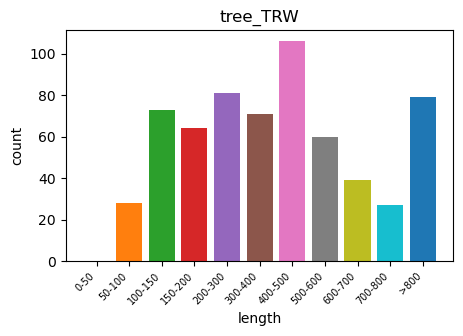

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1


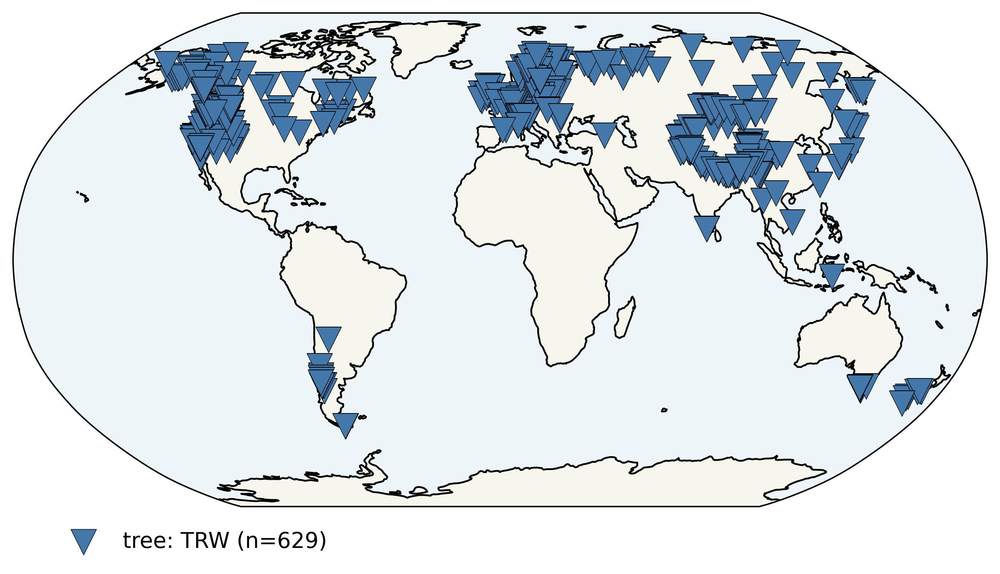

In [7]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'tree'
pt = 'TRW'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)

# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 145 records with nyears>=600 during 1000-2000. Exclude 484 records.
Keep 145 records with resolution <=1. Exclude 0 records.


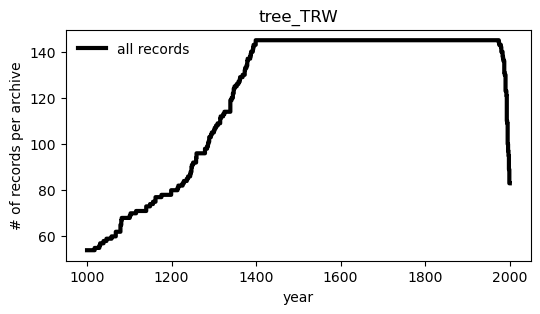

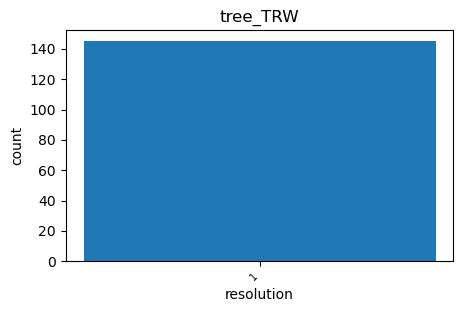

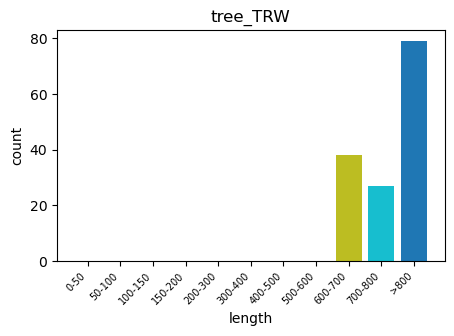

        miny    maxy                                   originalDatabase
35    1248.0  1975.0                  FE23 (Breitenmoser et al. (2014))
37     850.0  1990.0                  FE23 (Breitenmoser et al. (2014))
46    1355.0  1974.0                  FE23 (Breitenmoser et al. (2014))
114   1102.0  1984.0                  FE23 (Breitenmoser et al. (2014))
187   1381.0  1988.0                  FE23 (Breitenmoser et al. (2014))
...      ...     ...                                                ...
1074   898.0  1987.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1075   917.0  1987.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1076     1.0  1990.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1078   831.0  1992.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1079     1.0  1992.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...

[145 rows x 3 columns]


In [8]:
#========================= PROXY SPECIFIC=========================
minres    = 1                         # homogenised resolution
mny       = 1000                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([600, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

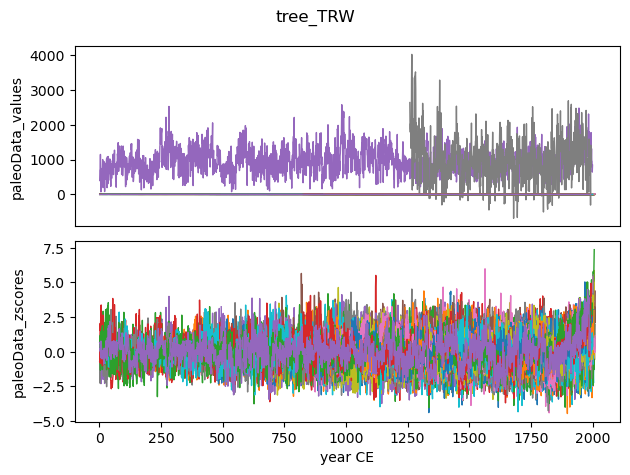

In [9]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [10]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom

Homogenised time coordinate: 1000-2000 CE
Resolution: [1] years
INTERSECT: 1400-1974


(145, 1001)
Real intersect after homogenising resolution: 
INTERSECT: 1400-1974


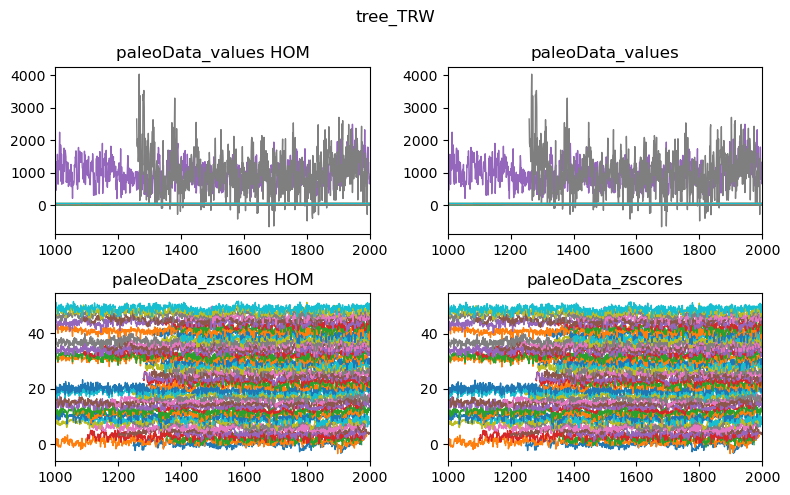

In [11]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


### PCA

In [12]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  []


saved figure in /figs/dod2k_dupfree_dupfree_T/foev_tree_TRW.pdf


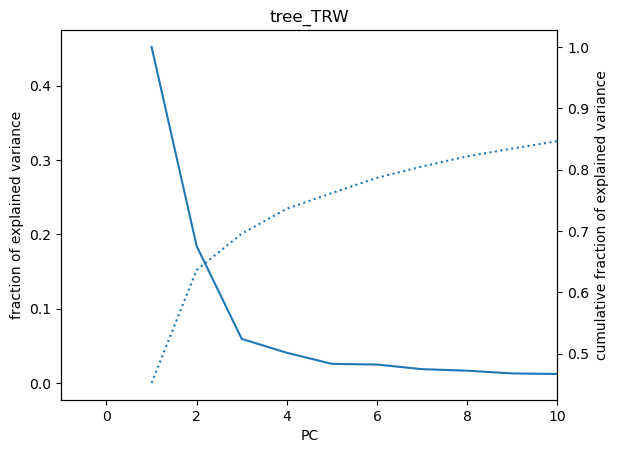

In [13]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)

saved figure in /figs/dod2k_dupfree_dupfree_T/PCs_tree_TRW.pdf
saved figure in /figs/dod2k_dupfree_dupfree_T/EOFloading_tree_TRW.pdf


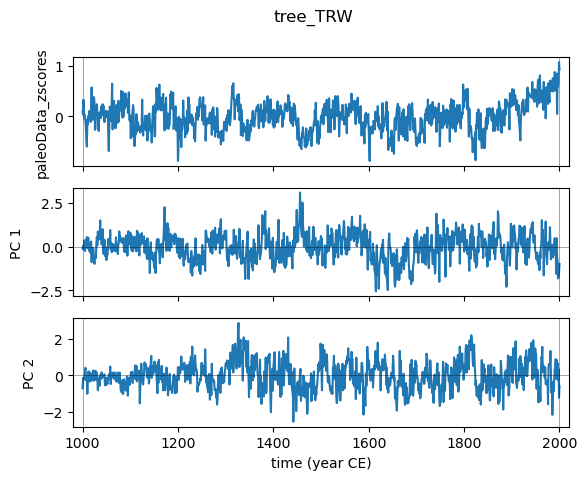

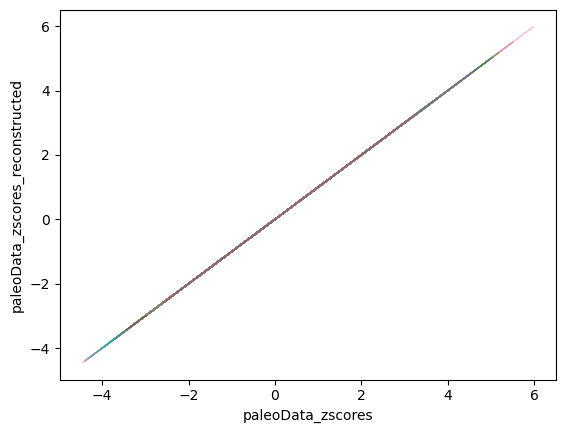

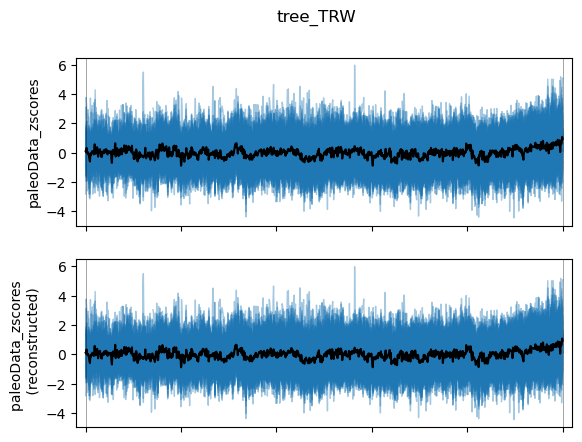

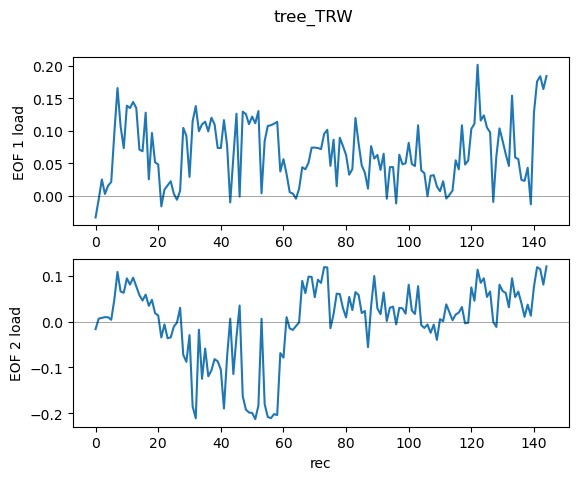

In [14]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [15]:
print('Finished for %s'%key)

Finished for tree_TRW


## tree d18O

### filter archive_type and paleoData_proxy

n_records   :  1
archive type:  {'tree'}
proxy type:    {'d18O'}


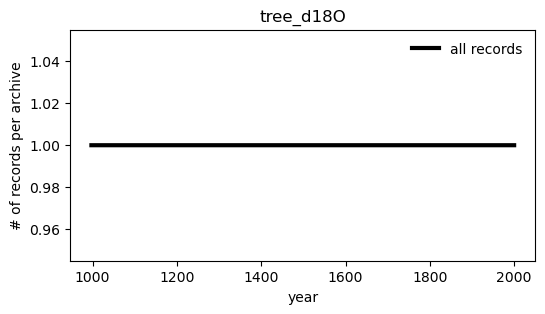

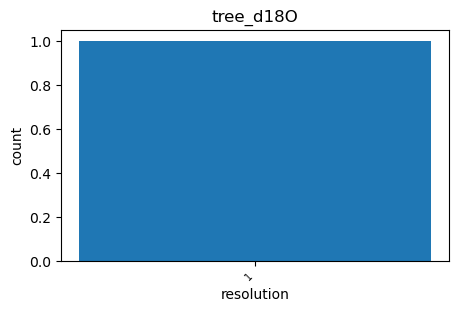

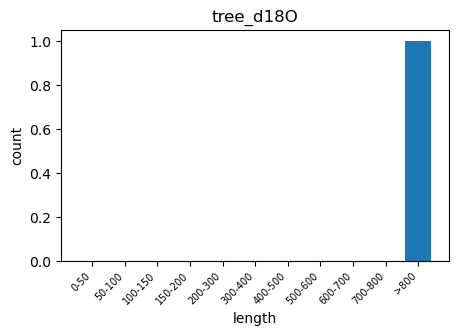

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1


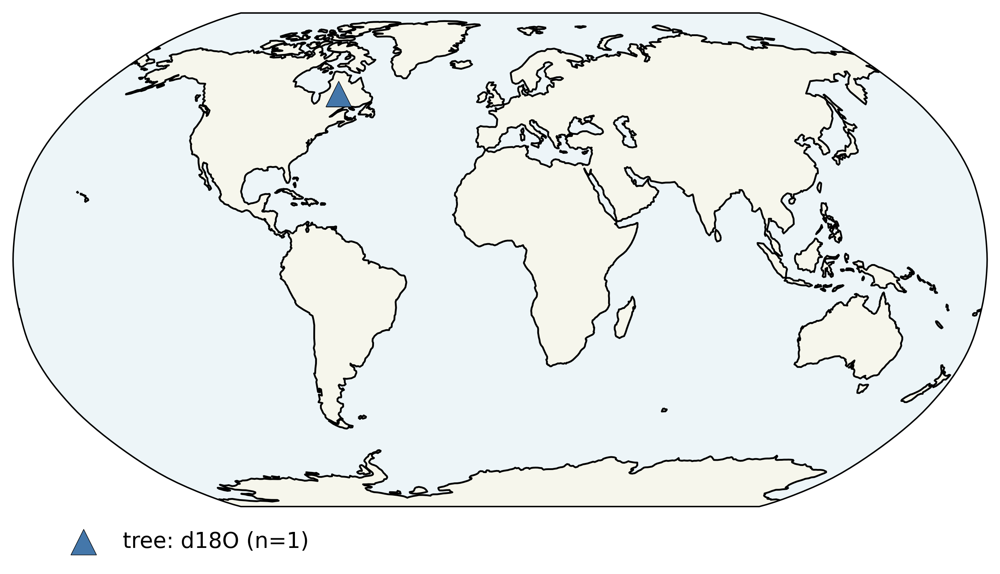

In [16]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'tree'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)


### filter for target period, resolution and minimum record length

Keep 1 records with nyears>=100 during 1700-2000. Exclude 0 records.
Keep 1 records with resolution <=2. Exclude 0 records.


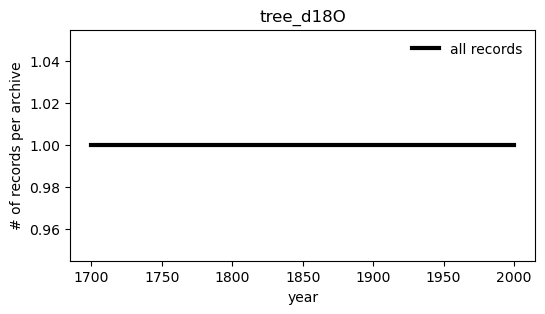

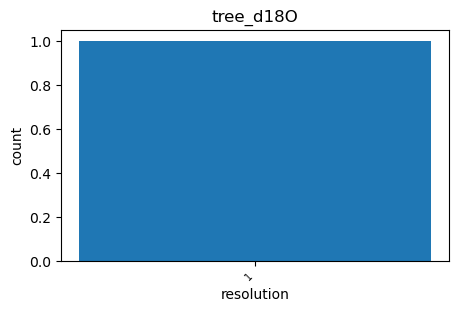

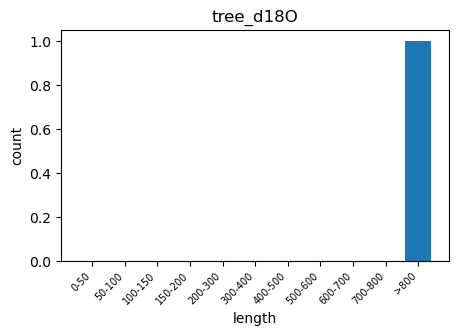

      miny    maxy originalDatabase
588  997.0  2000.0     Iso2k v1.0.1


In [17]:
#========================= PROXY SPECIFIC=========================
minres    = 2                         # homogenised resolution
mny       = 1700                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

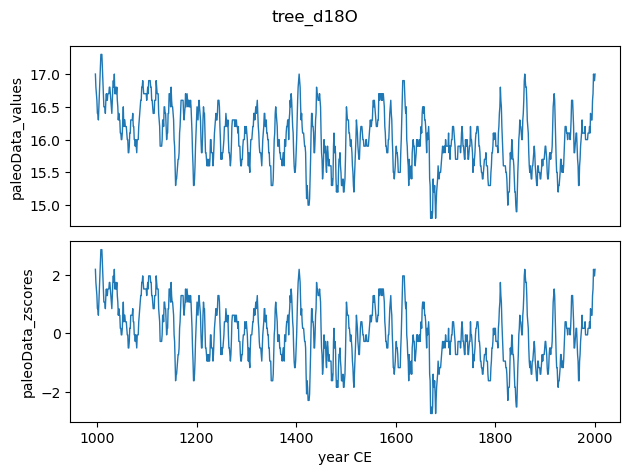

In [18]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [19]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


Homogenised time coordinate: 1700-2000 CE
Resolution: [2] years
INTERSECT: 997-2000


(1, 151)
Real intersect after homogenising resolution: 
INTERSECT: 1700-2000


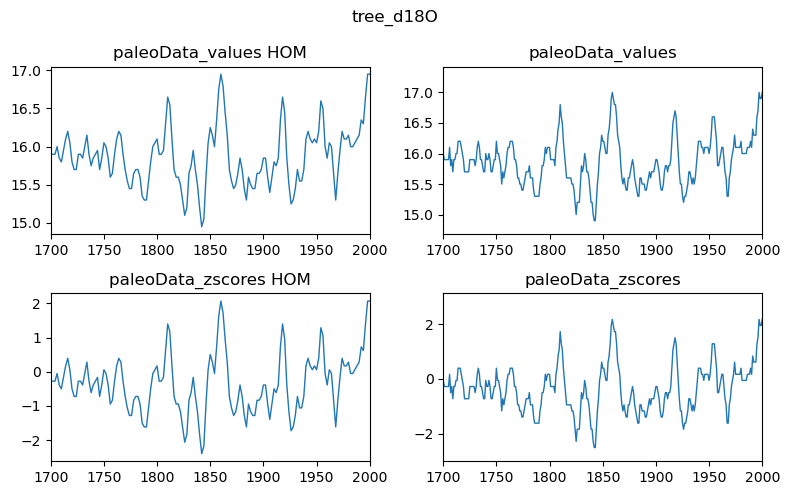

In [20]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


In [21]:
paleoData_values_hom.shape

(1, 151)

### PCA

In [22]:
#covariance, overlap = fan.calc_covariance_matrix(df_proxy)

In [23]:
#covariance.shape

In [24]:
#eigenvalues, eigenvectors = fan.PCA(covariance)

#foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [25]:
#eigenvectors.shape

In [26]:
#PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [27]:
#PCs[key].shape

In [28]:
print('Finished for %s'%key)
# raise Exception

Finished for tree_d18O


## coral d18O

### filter archive_type and paleoData_proxy

n_records   :  54
archive type:  {'coral'}
proxy type:    {'d18O'}


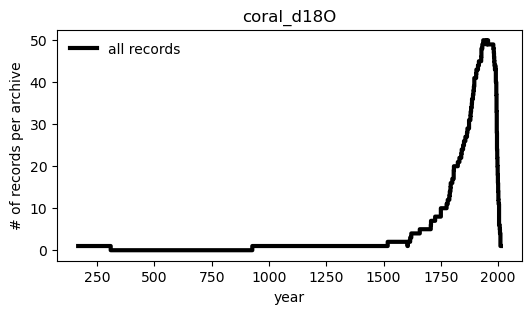

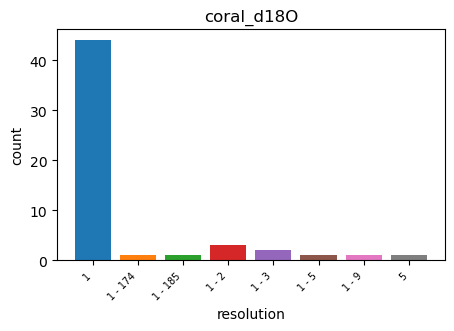

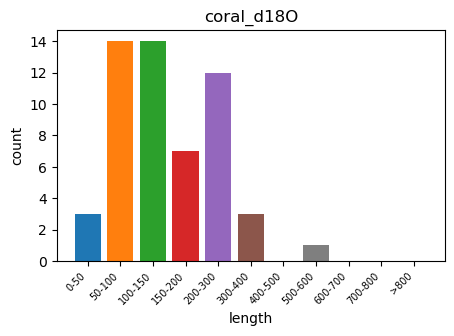

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1


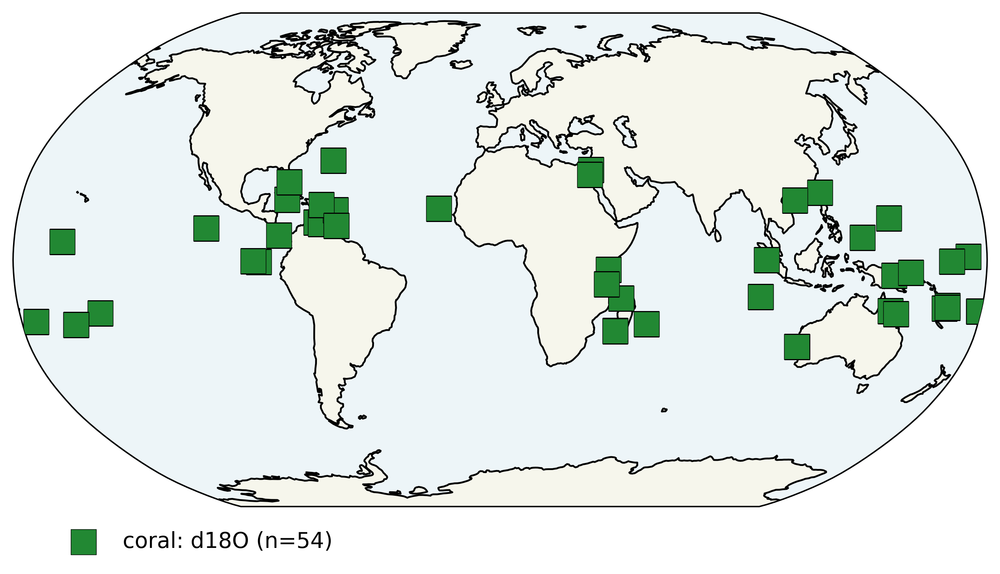

In [29]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'coral'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 40 records with nyears>=90 during 1750-2000. Exclude 14 records.
Keep 33 records with resolution <=1. Exclude 7 records.


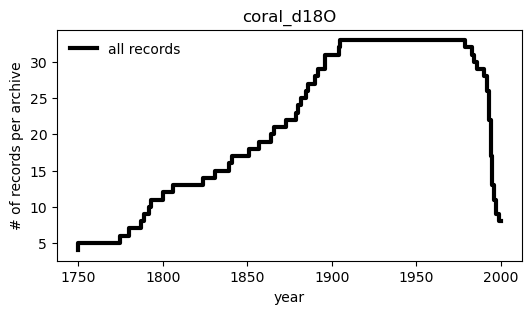

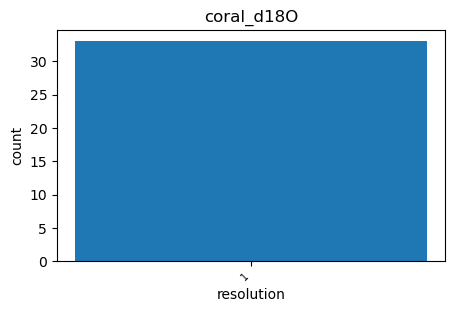

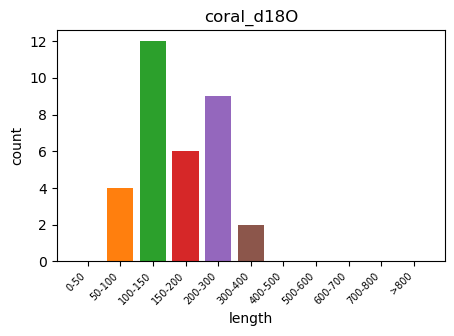

        miny    maxy                                   originalDatabase
440   1886.0  1992.0                                       Iso2k v1.0.1
441   1891.0  1995.0                                       Iso2k v1.0.1
596   1883.0  2004.0                                       Iso2k v1.0.1
598   1887.0  2012.0                                       Iso2k v1.0.1
1105  1801.0  1994.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1106  1865.0  1993.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1108  1881.0  1993.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1110  1858.0  1997.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1111  1832.0  1995.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1112  1788.0  1992.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1113  1897.0  1993.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1114  1659.0  1995.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee et al...
1115  1905.0  1994.0  PAGES2k v2.0.0 (Ocn_103 updated with Dee e

In [30]:
#========================= PROXY SPECIFIC=========================
minres    = 1                         # homogenised resolution
mny       = 1750                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([90, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

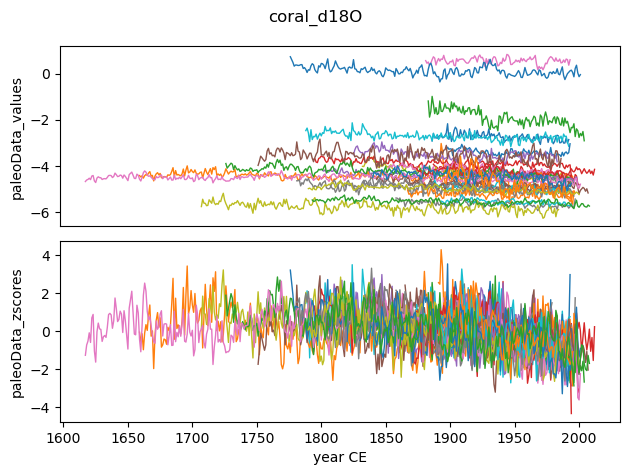

In [31]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [32]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


Homogenised time coordinate: 1750-2000 CE
Resolution: [1] years
INTERSECT: 1906-1979


(33, 251)
Real intersect after homogenising resolution: 
INTERSECT: 1906-1979


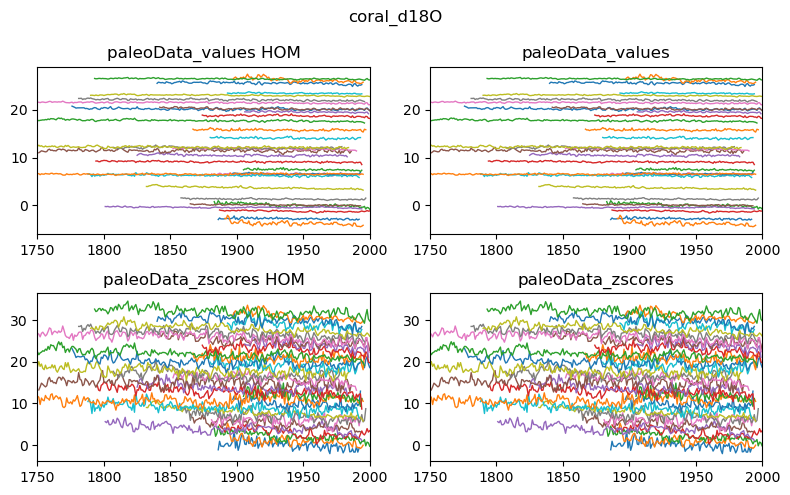

In [33]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [34]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  []


saved figure in /figs/dod2k_dupfree_dupfree_T/foev_coral_d18O.pdf


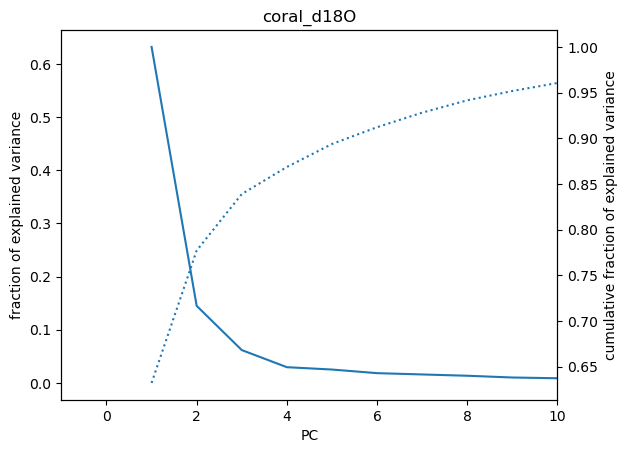

In [35]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [36]:
paleoData_zscores_hom.shape

(33, 251)

saved figure in /figs/dod2k_dupfree_dupfree_T/PCs_coral_d18O.pdf
saved figure in /figs/dod2k_dupfree_dupfree_T/EOFloading_coral_d18O.pdf


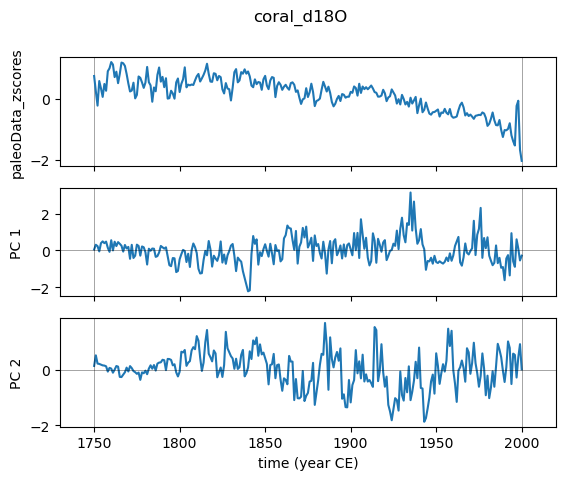

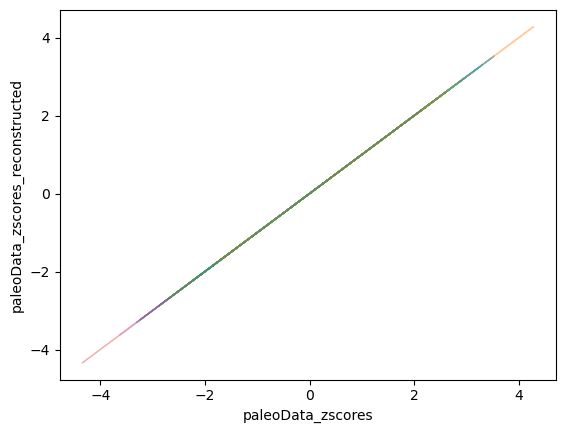

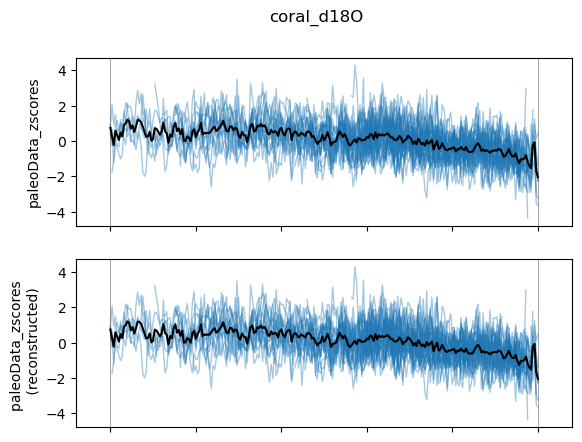

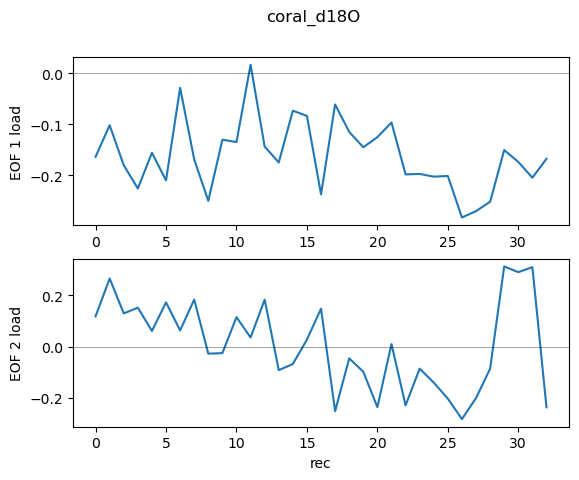

In [37]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [38]:
print('Finished for %s'%key)

Finished for coral_d18O


## speleothem d18O

### filter archive_type and paleoData_proxy

n_records   :  6
archive type:  {'speleothem'}
proxy type:    {'d18O'}


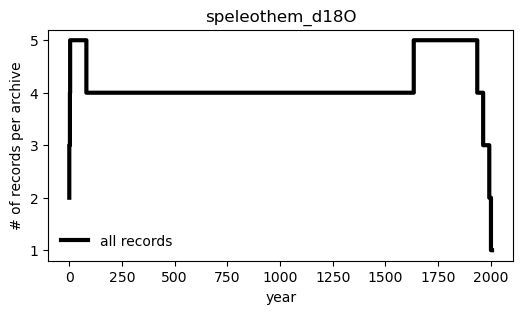

1 - 13   <15
9 - 22   <25
1    <5


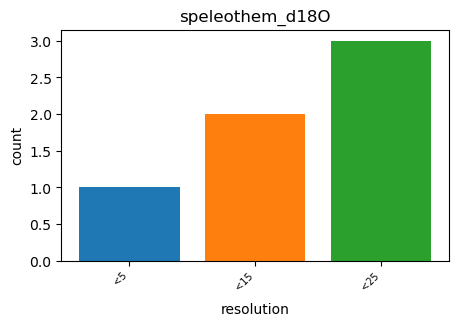

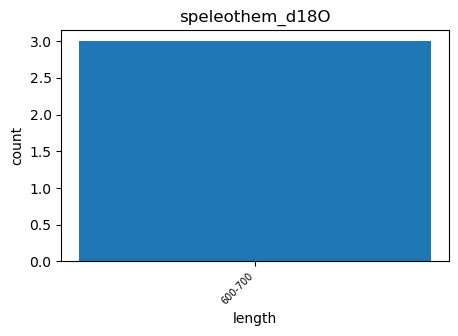

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1


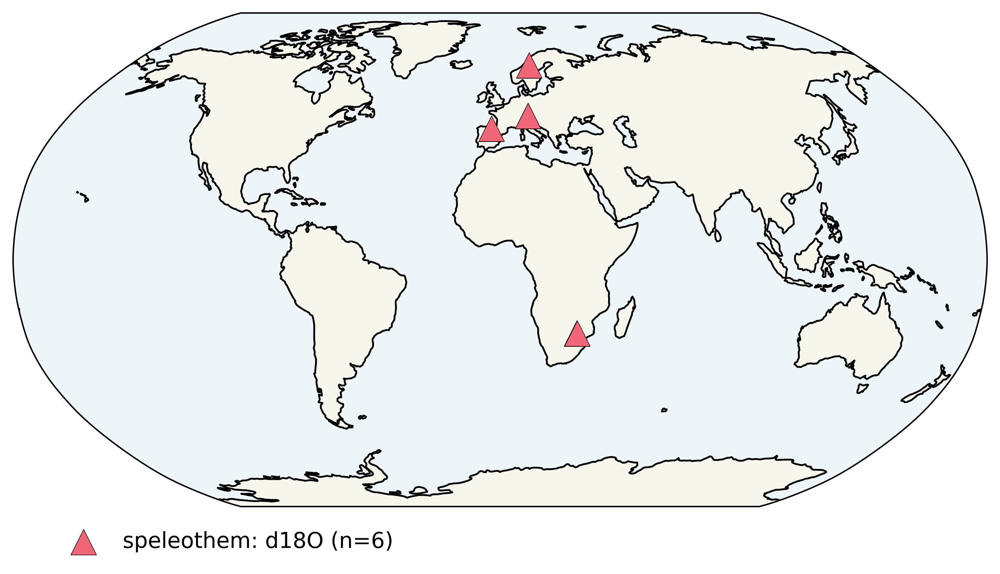

In [39]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'speleothem'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

In [40]:
#========================= PROXY SPECIFIC=========================
minres    = 101                         # homogenised resolution
mny       = 800                      # start year of homogenised time coord
mxy       = 1500                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
#df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
#df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
#fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
#fan.plot_resolution(df_proxy, key)
#fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


#print(df_proxy[['miny', 'maxy', 'originalDatabase']])

#pca_rec[key] = df_proxy['datasetId']

In [41]:
# add 'z-scores' to dataframe and plot z-scores and values
#df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [42]:
# define new homogenised time coordinate
#df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
#time[key] = years_hom


In [43]:
# assign the paleoData_values to the non-missing values in the homogenised data array

#out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
#paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
#new_columns = {'year_hom': [years_hom]*n_recs, 
#               'year_hom_avbl': year_hom_avbl, 
#               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
#               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
#               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
#df_proxy = df_proxy.assign(**new_columns)
#
#print('Real intersect after homogenising resolution: ')
#intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
#                            data='paleoData_zscores_hom_avbl')

#data[key] = paleoData_zscores_hom


### PCA

In [44]:
#covariance, overlap = fan.calc_covariance_matrix(df_proxy)

In [45]:
#eigenvalues, eigenvectors = fan.PCA(covariance)

#foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [46]:
#PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [47]:
print('Finished for %s'%key)

Finished for speleothem_d18O


## lake sediment d18O + d2H

### filter archive_type and paleoData_proxy

n_records   :  5
archive type:  {'lake sediment'}
proxy type:    {'d18O', 'd2H'}


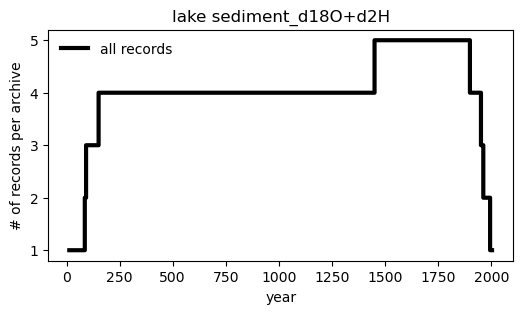

55 - 238  <250
1 - 48   <55
1 - 508  <550


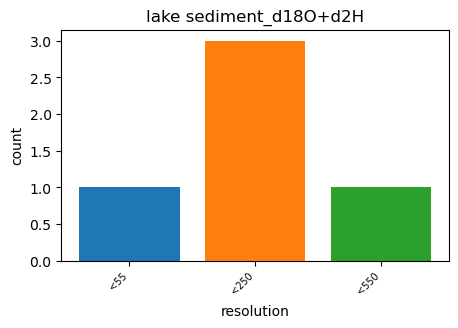

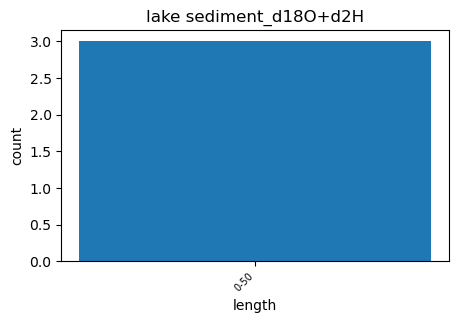

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1


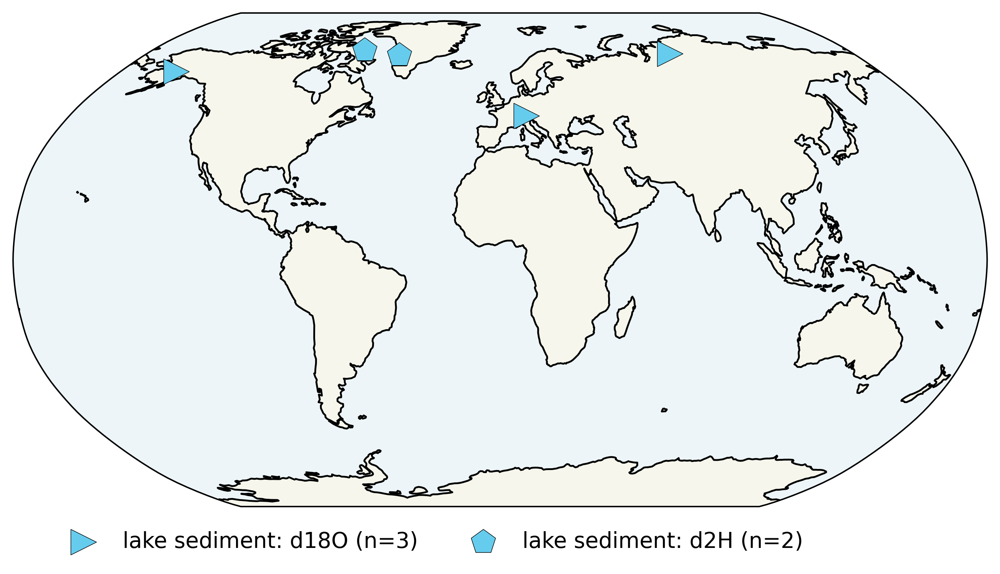

In [48]:
# (1) filter for archiveType and/or paleoData_proxy: 
at  = 'lake sediment'
pt  = 'd18O+d2H'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt.split('+')[0])|(df['paleoData_proxy']==pt.split('+')[1])]

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

In [49]:
#========================= PROXY SPECIFIC=========================
minres    = 55                         # homogenised resolution
mny       = 300                      # start year of homogenised time coord
mxy       = 1800                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
#df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
#df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
#fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
#fan.plot_resolution(df_proxy, key)
#fan.plot_length(df_proxy, key)

#n_recs = len(df_proxy) # final number of records


#print(df_proxy[['miny', 'maxy', 'originalDatabase']])

#pca_rec[key] = df_proxy['datasetId']

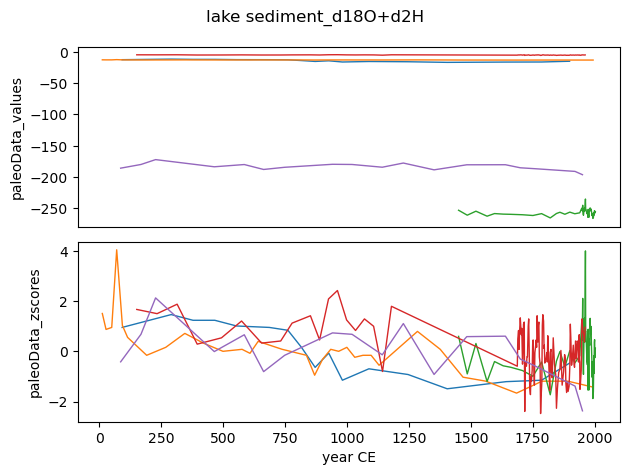

In [50]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)

### homogenise data dimensions across the records

Homogenised time coordinate: 300-1840 CE
Resolution: [55] years
No shared period across all records.


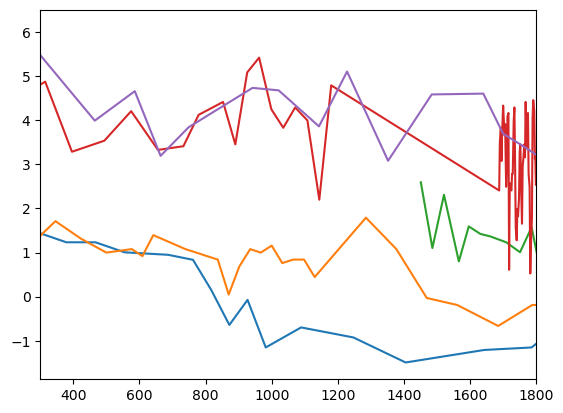

In [51]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


In [52]:
# assign the paleoData_values to the non-missing values in the homogenised data array

#out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
#paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
#new_columns = {'year_hom': [years_hom]*n_recs, 
#               'year_hom_avbl': year_hom_avbl, 
#               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
#               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
#               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
#df_proxy = df_proxy.assign(**new_columns)

#print('Real intersect after homogenising resolution: ')
#intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
#                             data='paleoData_zscores_hom_avbl')

#data[key] = paleoData_zscores_hom


### PCA

In [53]:
#covariance, overlap = fan.calc_covariance_matrix(df_proxy)

In [54]:
#eigenvalues, eigenvectors = fan.PCA(covariance)

#foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [55]:
#PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [56]:
#print('Finished for %s'%key)

## marine sediment d18O

### filter archive_type and paleoData_proxy

n_records   :  12
archive type:  {'marine sediment'}
proxy type:    {'d18O'}


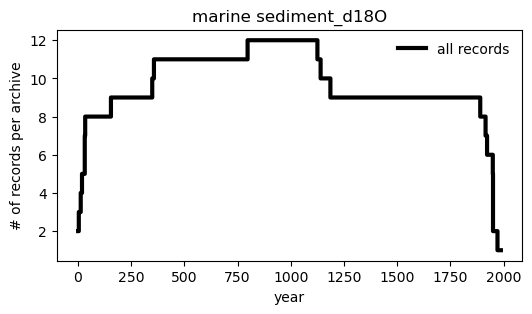

2 - 72   <75
60 - 136  <150
10 - 63   <65
16 - 93   <95
11 - 85   <85
6 - 13   <15


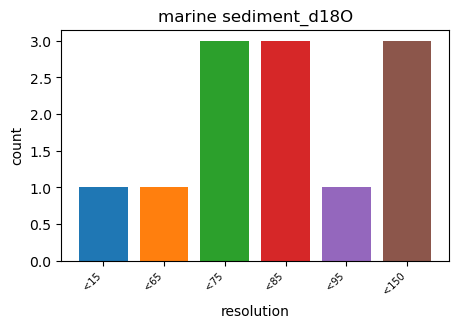

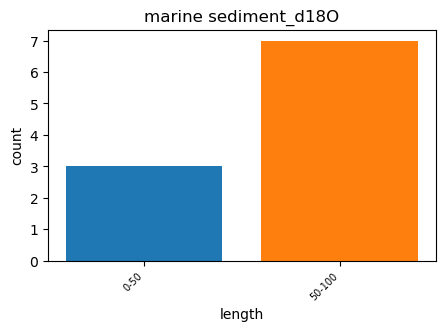

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1


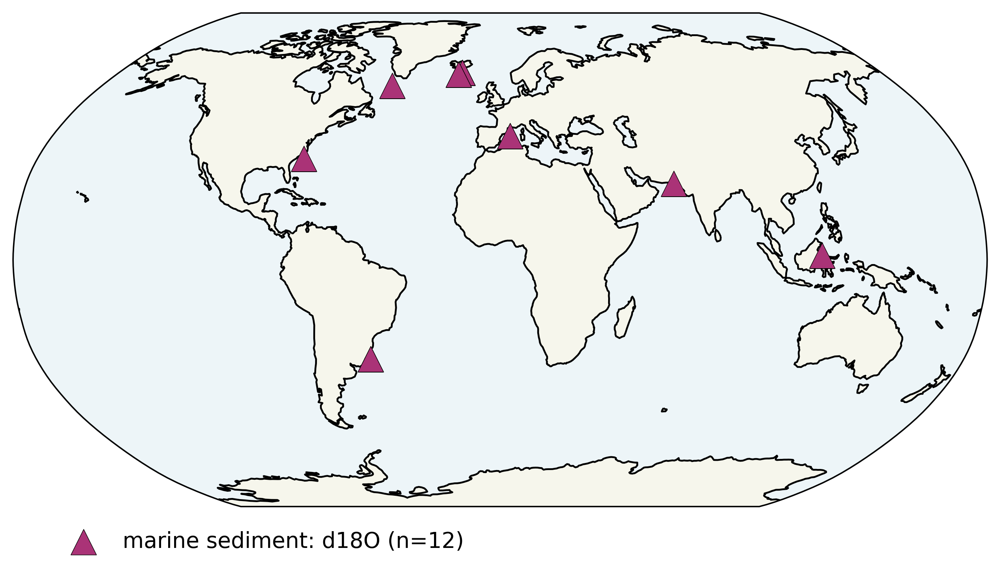

In [57]:
# (1) filter for archiveType and/or paleoData_proxy: 
at  = 'marine sediment'
pt  = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 1 records with nyears>=100 during 100-1800. Exclude 11 records.
Keep 1 records with resolution <=100. Exclude 0 records.


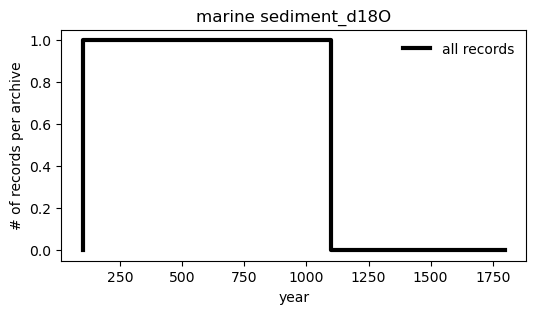

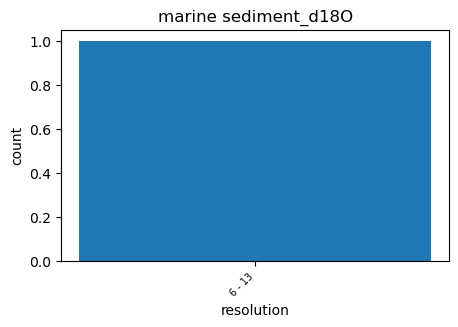

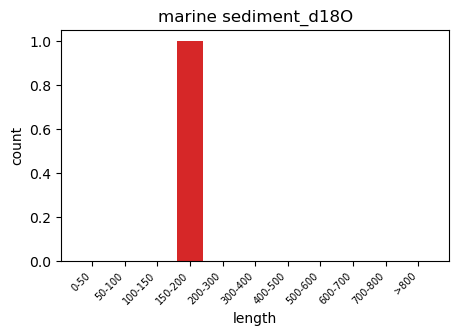

      miny    maxy originalDatabase
583  156.0  1125.0     Iso2k v1.0.1


In [58]:
#========================= PROXY SPECIFIC=========================
minres    = 100                         # homogenised resolution
mny       = 100                      # start year of homogenised time coord
mxy       = 1800                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

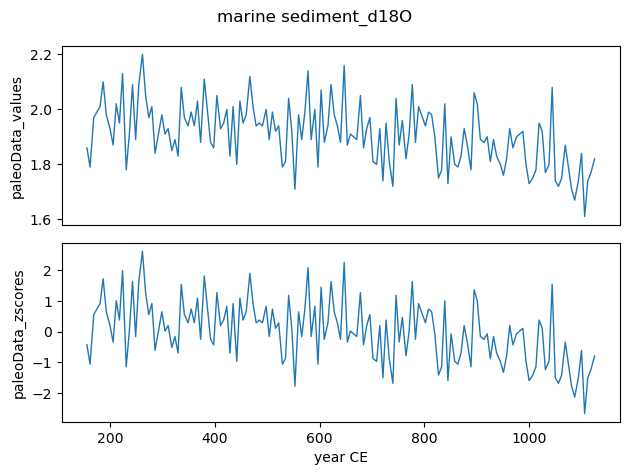

In [59]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)

### homogenise data dimensions across the records

In [60]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


Homogenised time coordinate: 100-1800 CE
Resolution: [100] years
INTERSECT: 156-1125


(1, 18)
Real intersect after homogenising resolution: 
INTERSECT: 200-1200


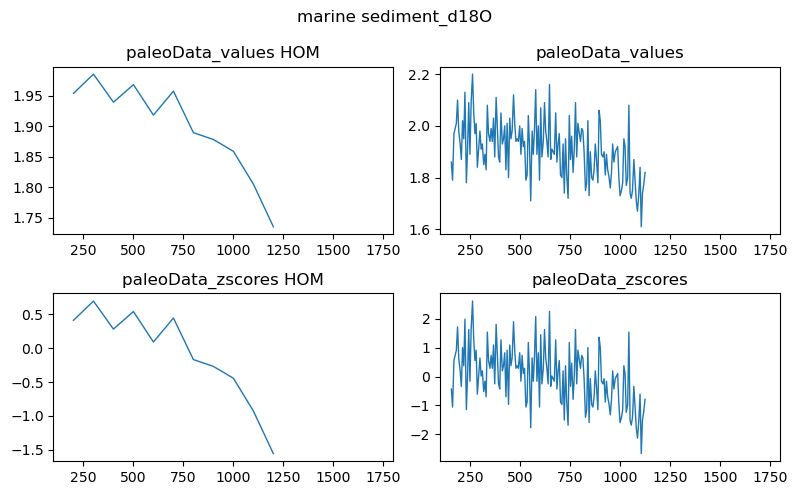

In [61]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [62]:
#covariance, overlap = fan.calc_covariance_matrix(df_proxy)

In [63]:
#eigenvalues, eigenvectors = fan.PCA(covariance)

#foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [64]:
#PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [65]:
print('Finished for %s'%key)

Finished for marine sediment_d18O


# summary figures

In [66]:
key_colour = {}
for key in keys:
    key_colour[key]=archive_colour[key.split('_')[0]]

key_colour['tree_d18O']='k'
print(keys)

['tree_TRW', 'tree_d18O', 'coral_d18O', 'speleothem_d18O', 'lake sediment_d18O+d2H', 'marine sediment_d18O']


## mean z-score

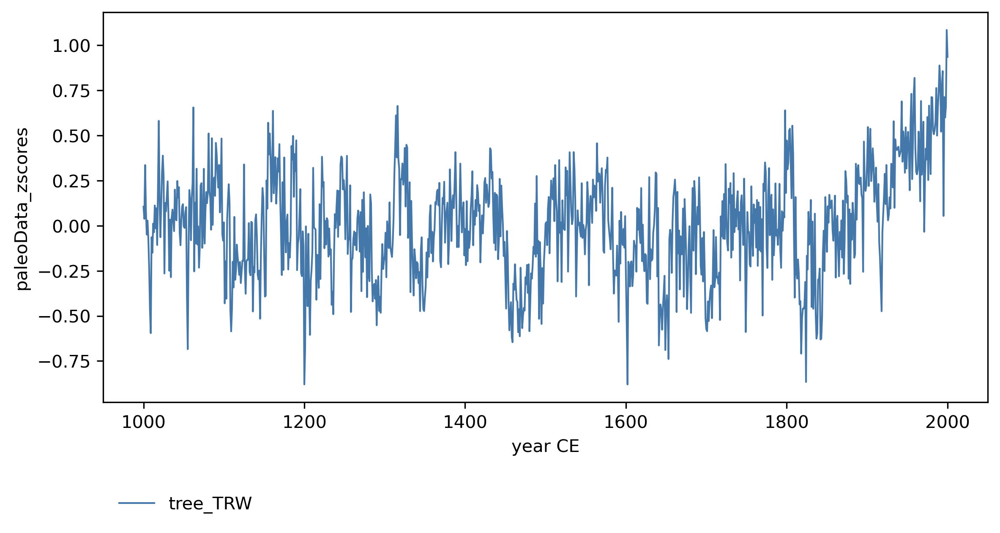

In [67]:
# as a comparison plot the mean over all records
fig = plt.figure(figsize=(9, 4), dpi=300)
#for key in keys:
for key in ['tree_TRW']:
    lw = 1 if key in ['tree_TRW', 'tree_d18O', 'coral_d18O'] else 2
    plt.plot(time[key], np.ma.mean(data[key], axis=0)-np.mean(np.ma.mean(data[key], axis=0)), 
             label=key, lw=lw, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')
plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

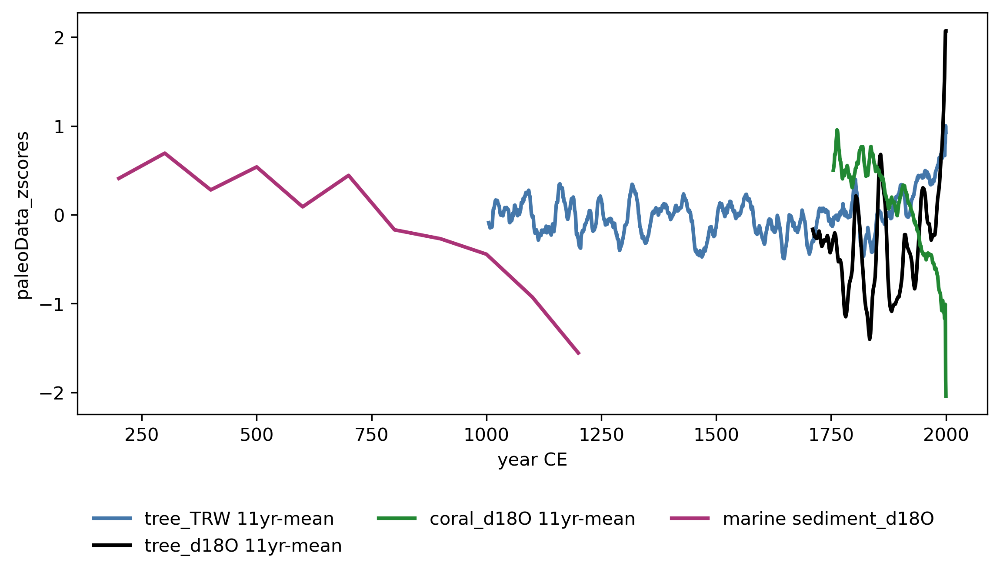

In [68]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 4), dpi=300)
for key in keys:
    try:
        if key in ['tree_TRW', 'tree_d18O', 'coral_d18O']:
            tt, dd = fan.smooth(np.ma.mean(data[key], axis=0), time[key], 11)
            label=key+' 11yr-mean'
        else:
            tt, dd = time[key], np.ma.mean(data[key], axis=0)
            label=key
    except KeyError: 
        continue
    plt.plot(tt, dd, label=label, lw=2, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')    
plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

## Fraction of Explained Variance

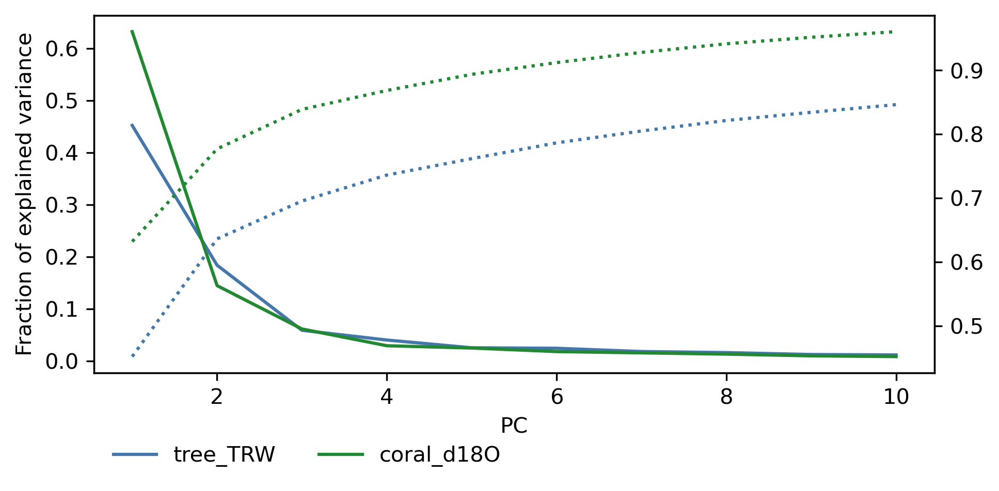

In [69]:
fig = plt.figure(figsize=(7,3), dpi=300)
ax  = plt.gca()
ax2 = ax.twinx()
for key in keys:
    try:
        ax.plot(range(1,11), foev[key][:10], label=key, color=key_colour[key])
        ax2.plot(range(1,11), np.cumsum(foev[key][:10]), label=key, ls=':', color=key_colour[key])
    except KeyError:
        continue
ax.set_ylabel('Fraction of explained variance')
# ax2.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.legend(ncol=3, bbox_to_anchor=(0,-0.15), loc='upper left', framealpha=0)

## 1st and 2nd PC

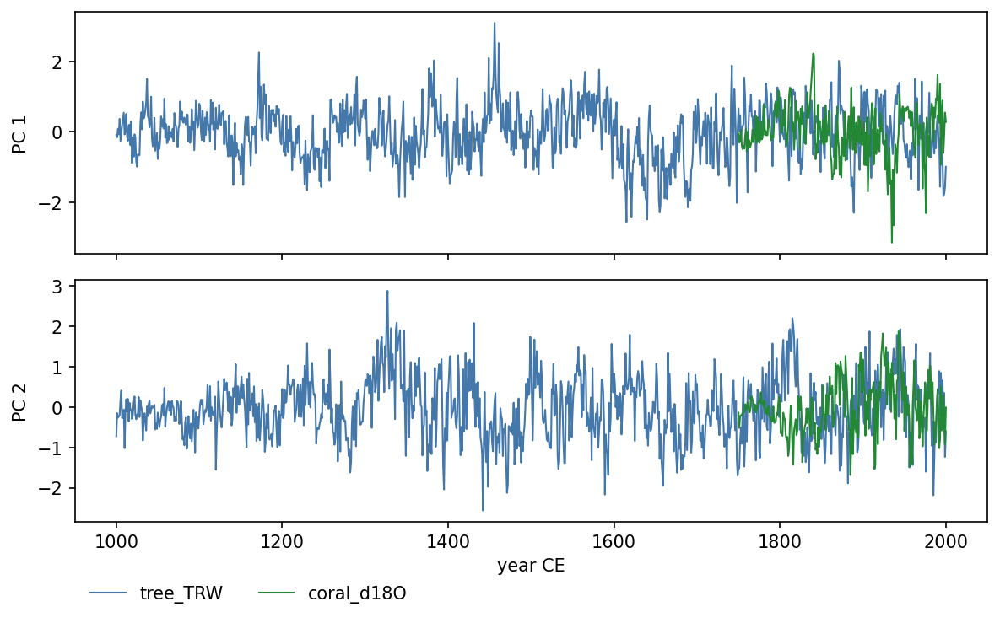

In [70]:
# plot PCs of different proxy types on the same axis. 
# Note that these are plotted as calculated in the respective analysis- NOT standardised differently!

fig = plt.figure(figsize=(8,5), dpi=150)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        try:
            a=1 if key in ['tree_TRW', 'speleothem_d18O', 'lake sediment_d18O+d2H'] else -1
            plt.plot(time[key], a*PCs[key][ii], label=key, color=key_colour[key], lw=1)
        except KeyError: continue
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
    plt.ylabel('PC %d'%(ii+1)) 
plt.xlabel('year CE')

plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
grid.tight_layout(fig)



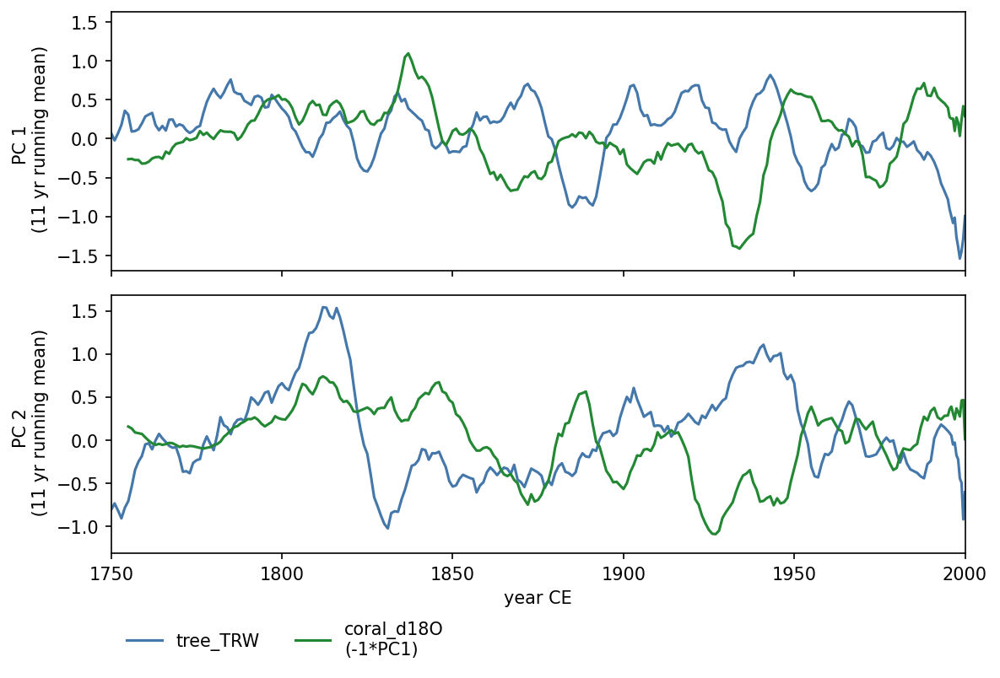

In [71]:
# plot PCs of different proxy types on the same axis. 
# SMOOTHED VIA 11YEAR RUNNING MEAN
fig = plt.figure(figsize=(8,5), dpi=150)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        try:
            label = key
            if ((key in ['tree_d18O', 'coral_d18O']) and (ii==0)):
                a = -1 
                label+= '\n(-1*PC1)'
            else:
                a = 1
            resolution = np.unique(np.diff(time[key]))[0]
            if key in ['tree_TRW', 'tree_d18O', 'coral_d18O']:
                smooth = 11
                tt, dd = fan.smooth(PCs[key][ii], time[key], int(smooth/resolution))
                # label+=' %d-yr mean'%smooth
            else:
                tt, dd = time[key], PCs[key][ii]
            plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key])
        
        except KeyError: continue
    plt.ylabel('PC %d \n (%d yr running mean)'%(ii+1, smooth))
    plt.xlim(1750,2000)
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
        hh, ll = ax.get_legend_handles_labels()
plt.xlabel('year CE')

grid.tight_layout(fig)

plt.legend(hh, ll, ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
plt.show()


## 1st and 2nd EOF

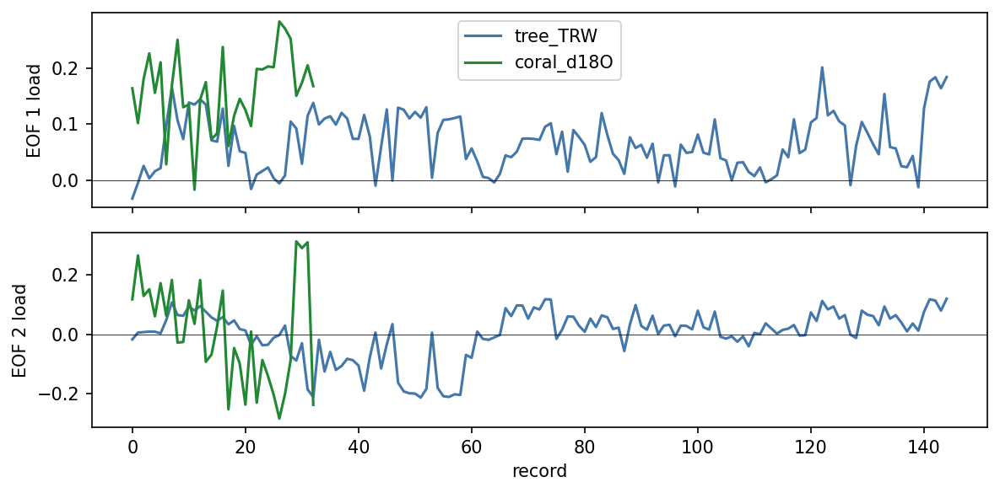

In [79]:

fig = plt.figure(figsize=(8,4), dpi=150)

grid = GS(2,1)
for key in keys:
    try:
        n_recs = data[key].shape[0]
        for ii in range(2):
            ax = plt.subplot(grid[ii,:])
            if ((key in ['tree_d18O', 'coral_d18O']) and (ii==0)):
                a = -1 
                label+= '\n(-1*PC1)'
            else:
                a = 1
            plt.plot(range(n_recs), a*EOFs[key][ii], label=key, color=key_colour[key])
            if ii==1: plt.xlabel('record')
            plt.ylabel('EOF %d load'%(ii+1))
            plt.axhline(0, color='k', alpha=0.5, lw=0.5)
            if ii==0: 
                ax.axes.xaxis.set_ticklabels([])
            if ii==0: plt.legend()
                
    except KeyError: continue
grid.tight_layout(fig)

## spatial EOF load

{'tree_TRW': 1, 'coral_d18O': -1}
saved figure in /dod2k_dupfree_dupfree_T/figs///T_spatial_EOF1.pdf


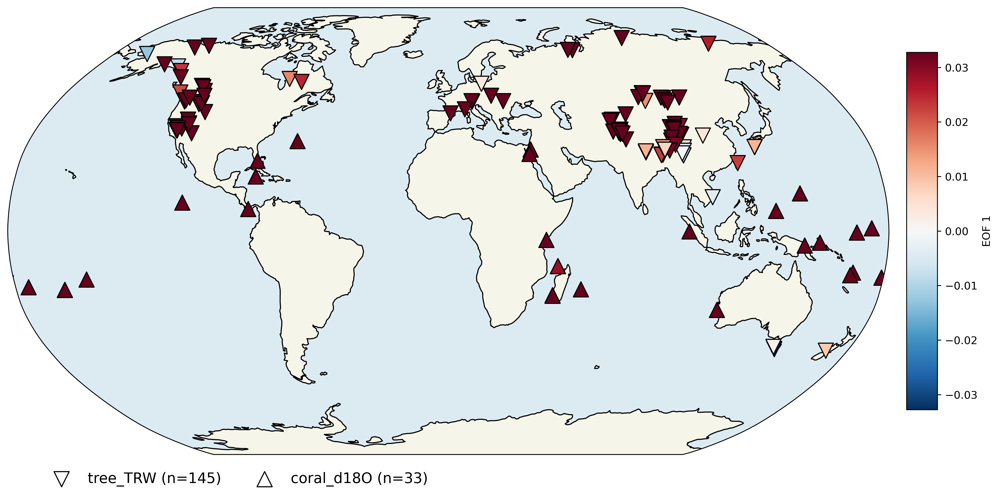

In [82]:
fig = fan.geo_EOF_plot(df, pca_rec, EOFs, ['tree_TRW', 'coral_d18O'], barlabel='EOF 1', which_EOF=0)
#print(keys)
f.figsave(fig, 'T_spatial_EOF1', addfigs='/%s/figs/'%df.name)


saved figure in /dod2k_dupfree_dupfree_T/figs///T_spatial_EOF2.pdf


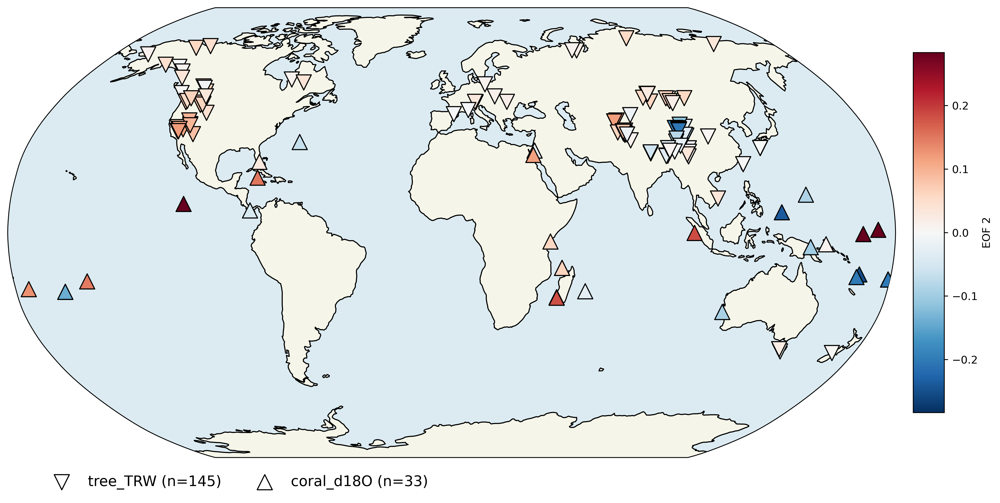

In [74]:
fig = fan.geo_EOF_plot(df, pca_rec, EOFs, ['tree_TRW', 'coral_d18O'], barlabel='EOF 2', which_EOF=1)
#print(keys)
f.figsave(fig, 'T_spatial_EOF2', addfigs='/%s/figs/'%df.name)


## spatial distribution

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 terrestrial sediment 2
11 mollusk shells 2
12 hybrid 1
13 bivalve 1
saved figure in /dod2k_dupfree_dupfree_T/figs///T_spatial.pdf


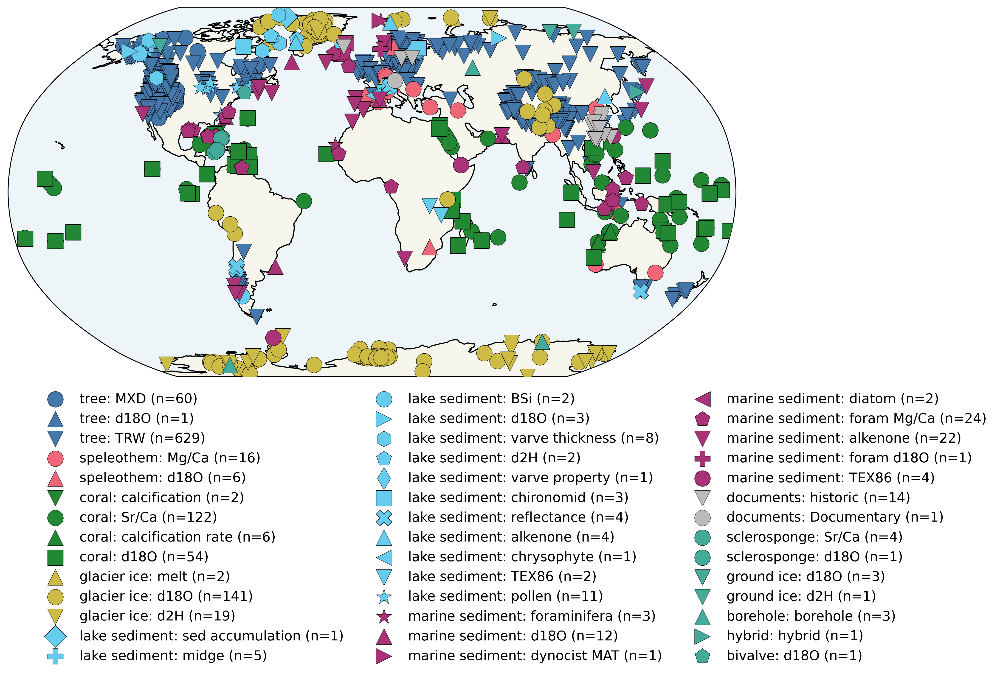

In [75]:
fig = fan.geo_plot(df, fs=(13,8))

# There is a bug in this figure due to lake sediments not being bolded!!

f.figsave(fig, 'T_spatial', addfigs='/%s/figs/'%df.name)

saved figure in /dod2k_dupfree_dupfree_T/figs///T_PCA.pdf


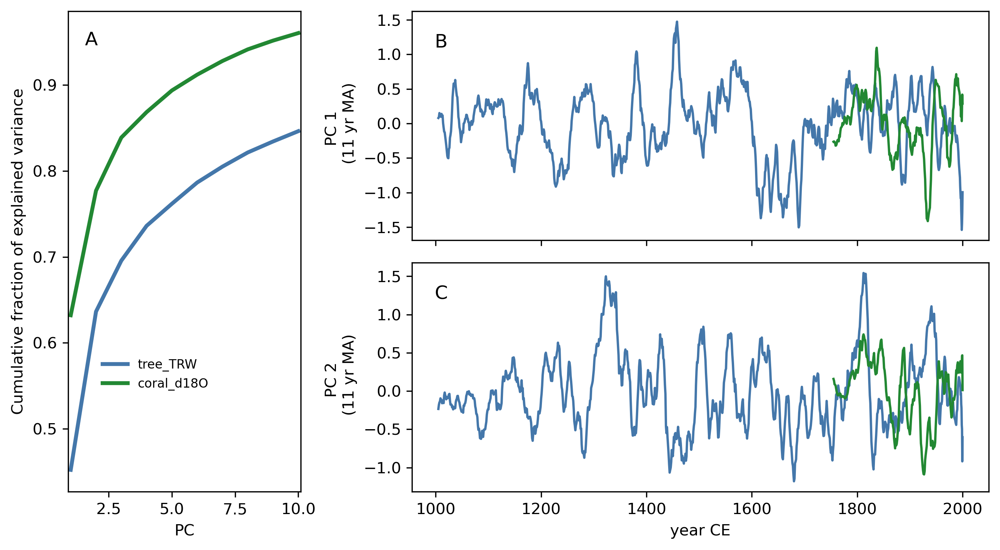

In [76]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 5), dpi=300)


keys = ['tree_TRW', 'coral_d18O']
grid = GS(2,3)

ax=plt.subplot(grid[:,0])
ax  = plt.gca()
# ax2 = ax.twinx()
for key in keys:
    # ax.plot(range(1,9), foev[key][:8], label=key, color=key_colour[key])
    ax.plot(range(1,11), np.cumsum(foev[key][:10]), label=key, color=key_colour[key], lw=2.5)
ax.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.set_xlim(.9,10.1)
plt.title('A', x=0.1, y=0.91)

grid.tight_layout(fig)
grid.update(hspace=0.1,wspace=0.3)
plt.legend(ncol=1, bbox_to_anchor=(0.1,0.3), 
           loc='upper left', framealpha=0, fontsize=8, facecolor='white')
# plt.grid()

smooth = 11
            
for key in keys:
    label = key
    resolution = np.unique(np.diff(time[key]))[0]
    #print(resolution, smooth, int(smooth/resolution))

    if resolution<smooth:
        tt, dd = fan.smooth(np.ma.mean(data[key], axis=0), time[key], smooth)
    else:
        tt, dd = time[key], np.ma.mean(data[key], axis=0)
    
    for ii in range(2):
        ax = plt.subplot(grid[ii,1:4])
        # warmer and wetter is more negative in coral d18O; 
        # warmer is more positive and wetter is more negative (maybe?) in tree d18O
        if ((key in ['tree_d18O', 'coral_d18O']) and (ii==0)):
            a = -1 # multiply PC sign by -1
            label+= '\n(-1*PC1)' # and label it as such
        else:
            a = 1
        if resolution<smooth:
            tt, dd = fan.smooth(PCs[key][ii], time[key], int(smooth/resolution))
        else:
            tt, dd = time[key], PCs[key][ii]
        plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key], lw=1.5)
        plt.ylabel('PC %d \n (%d yr MA)'%(ii+1, smooth))
        plt.grid()
        if ii==0: 
            ax.axes.xaxis.set_ticklabels([])
        plt.title('BC'[ii], x=0.05, y=0.8)
        # plt.xlim(1750, 2010)
        
plt.xlabel('year CE')
grid.tight_layout(fig)
f.figsave(fig, 'T_PCA', addfigs='/%s/figs/'%df.name)